In [1]:
import sys
sys.path.append("../src/")

In [2]:
%load_ext autoreload
%autoreload 2

import pydevil

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Generalized Linear Mixed Effects modelling

We will use the dataset published in 

In [3]:
import scanpy as sc
import patsy as ptsy
import pandas as pd
import torch
import numpy as np

In [4]:
adata = sc.datasets.ebi_expression_atlas("E-MTAB-8559", filter_boring = True)

sc.pp.filter_genes(adata, min_cells=50)
sc.pp.filter_cells(adata, min_genes=200)

In [5]:
# a bit of metadata cleaning

adata.obs.columns = adata.obs.columns.str.replace("Factor Value[", "")
adata.obs.columns = adata.obs.columns.str.replace("]", "")
# remove duplicated coloumn
adata.obs = adata.obs.drop(columns = "individual")
adata.obs.columns = adata.obs.columns.str.replace("Sample Characteristic[", "")
adata.obs.columns = adata.obs.columns.str.replace("growth condition", "growth_condition")

In [6]:
np.asarray(adata.X.sum(1).flatten()).squeeze(0).shape

(19880,)

In [7]:
n_counts = np.asarray(adata.X.sum(1).flatten()).squeeze(0)
library_size_factors = n_counts / n_counts.mean()

covariates = ptsy.dmatrix("~ growth_condition - 1", adata.obs)
random_effects = ptsy.dmatrix("~ individual - 1 ", adata.obs)

In [8]:
res_no_random_effects  = pydevil.run_SVDE(adata.X.todense(), 
                        covariates, # new design matrix 
                        library_size_factors, 
                        gene_names = adata.var_names,
                        cell_names = adata.obs_names, 
                        optimizer_name = "Adam", 
                        lr = 0.1,
                        gamma_lr = 0.001,
                        steps = 500, 
                        full_cov = True, 
                        cuda = True)

cuda:0


ELBO: 61461936.00000  : 100%|██████████| 500/500 [00:41<00:00, 12.17it/s]   


In [9]:
import dash_bio

contrast = np.array([1,-1]) 

In [10]:
marker_genes = pydevil.test_posterior(res_no_random_effects, contrast, 0.05)

In [11]:
marker_genes_renamed = pydevil.rename_for_volcano(marker_genes)

volcanoplot = dash_bio.VolcanoPlot(
    dataframe=marker_genes_renamed,
    point_size=8,
    effect_size_line_width=2,
    genomewideline_width=2
)

volcanoplot

In [12]:
random_effects.shape

(19880, 4)

In [13]:
res_random_effects  = pydevil.run_SVDE(adata.X.todense(), 
                        covariates, 
                        library_size_factors, 
                        group_matrix = random_effects, # we correct for individual variability                
                        gene_names = adata.var_names,
                        cell_names = adata.obs_names, 
                        optimizer_name = "Adam", 
                        lr = 0.1,
                        gamma_lr = 0.001,
                        steps = 500, 
                        full_cov = True, 
                        cuda = True)

cuda:0


ELBO: 66104652.00000  : 100%|██████████| 500/500 [00:34<00:00, 14.58it/s] 


In [14]:
marker_genes = pydevil.test_posterior(res_random_effects, contrast, 0.05)

In [15]:
marker_genes_renamed = pydevil.rename_for_volcano(marker_genes)

volcanoplot = dash_bio.VolcanoPlot(
    dataframe=marker_genes_renamed,
    point_size=8,
    effect_size_line_width=2,
    genomewideline_width=2
)

volcanoplot

In [88]:
adata.raw = adata.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_pcs=30)
sc.tl.umap(adata)

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning:

Some cells have zero counts

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning:

invalid value encountered in log1p



ValueError: Bin edges must be unique: array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan]).
You can drop duplicate edges by setting the 'duplicates' kwarg

In [17]:
kernel_input = adata.obsm["X_umap"]

In [56]:
res_random_effects_kernel  = pydevil.run_SVDE(adata.raw[:,adata.var_names].X.todense(), 
                        covariates, 
                        library_size_factors, 
                        group_matrix = random_effects, # we correct for individual variability                
                        gene_names = adata.var_names,
                        cell_names = adata.obs_names, 
                        kernel_input = kernel_input,
                        optimizer_name = "Adam", 
                        lr = 0.1,
                        gamma_lr = 0.1,
                        steps = 500, 
                        full_cov = True, 
                        cuda = True)

cuda:0


ELBO: 21115910.00000  : 100%|██████████| 500/500 [00:32<00:00, 15.27it/s]


In [89]:
lengthscale_df = pd.DataFrame({"gene_name" : adata.var_names,
                               "lengthscale": res_random_effects_kernel["params"]["lengthscale_kernel"],
                              "avg_expression" : adata.X.mean(axis = 0)})

In [90]:
lengthscale_df.sort_values(by = "avg_expression", ascending= False)

,gene_name,lengthscale,avg_expression
0,ENSG00000000971,0.039084,NaN
1,ENSG00000001084,0.029748,NaN
2,ENSG00000002016,0.046000,NaN
3,ENSG00000003137,0.059774,NaN
4,ENSG00000003436,0.013929,NaN
...,...,...,...
3212,ENSG00000288656,0.160891,NaN
3213,ENSG00000288681,0.053713,NaN
3214,ENSG00000288825,0.082686,NaN
3215,ENSG00000288859,0.071728,NaN


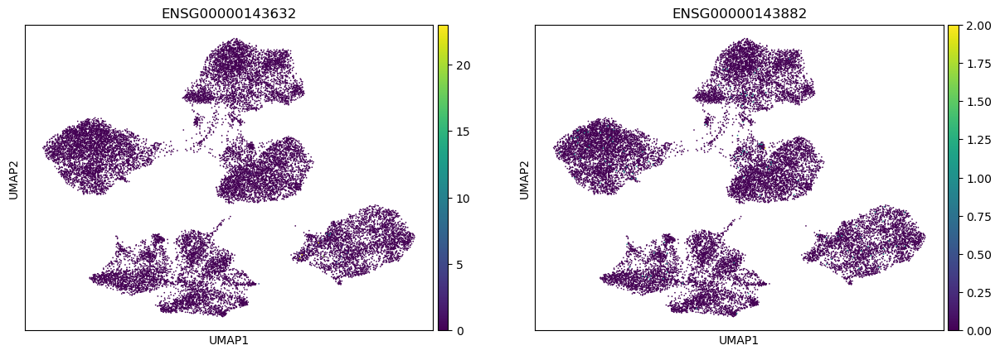

In [87]:
sc.pl.umap(adata, color=["ENSG00000143632", "ENSG00000143882"])

In [59]:
marker_genes = pydevil.test_posterior(res_random_effects_kernel, contrast, 0.05)

In [60]:
marker_genes_renamed = pydevil.rename_for_volcano(marker_genes)

volcanoplot = dash_bio.VolcanoPlot(
    dataframe=marker_genes_renamed,
    point_size=8,
    effect_size_line_width=2,
    genomewideline_width=2
)

volcanoplot

In [70]:
adata.X.mean(axis = 0).shape

(3217,)